<a href="https://colab.research.google.com/github/dcepeda2/Cumulos-abiertos/blob/main/Codigo_Fotometria_de_apertura.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Aperture Photometry 1

In [ ]:
from glob import glob
from astropy.io import fits
from astropy.visualization import hist
from astropy.modeling import fitting
from astropy.modeling.models import custom_model
fitter = fitting.LevMarLSQFitter()

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colormaps
import scipy.ndimage as ndi
import astropy.stats as astrostats

# configuration
np.set_printoptions(linewidth=120) # para que se vea

cmap = plt.get_cmap("inferno")
cmap.set_bad(color="r")
cmap.set_over(color="w")
if "astro" in plt.colormaps():
    colormaps.unregister("astro")
colormaps.register(cmap,name="astro")
plt.rcParams["image.origin"] = "lower"
plt.rcParams["image.cmap"] = "astro"
plt.rcParams["figure.figsize"] = (10,5)
plt.rcParams["axes.labelsize"] = 15



def quantile_linspace(arr,num=100,lower=0.01,upper=0.99):
    return np.linspace(*np.quantile(np.ravel(arr),[lower,upper]),num=num)

def quantile_imshow(img,lower=0.01,upper=0.99,**kwargs):
    img_vmin = np.quantile(img,lower)
    img_vmax = np.quantile(img,upper)
    return plt.imshow(img,vmin=img_vmin,vmax=img_vmax,**kwargs)

def quantile_hist(data,num=100,lower=0.01,upper=0.99):
    return plt.hist(np.ravel(data),bins=quantile_linspace(np.ravel(data),num,lower,upper))

def pseudomode(arr,sigma=1.6,maxiters=20):
    masked = astrostats.sigma_clip(arr,sigma=sigma,maxiters=maxiters)
    return arr[~masked.mask].mean()

In [ ]:
#pip install photutils

# M 92

In [ ]:
hdul = fits.open("data/M92.fits");
images = {hdu.name:hdu.data.astype(float) for hdu in hdul}
headers = {hdu.name:hdu.header for hdu in hdul}
hdul.close()

In [ ]:
fits.info("data/M92.fits")

Filename: data/M92.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  BIAS 25       1 PrimaryHDU      46   (318, 507)   int16   
  1  FLAT B 5      1 ImageHDU        45   (318, 507)   int16   
  2  FLAT V 5      1 ImageHDU        45   (318, 507)   int16   
  3  V 1           1 ImageHDU        45   (318, 507)   int16   
  4  V 2           1 ImageHDU        45   (318, 507)   int16   
  5  B 1           1 ImageHDU        45   (318, 507)   int16   
  6  B 2           1 ImageHDU        45   (318, 507)   int16   


## Bias model

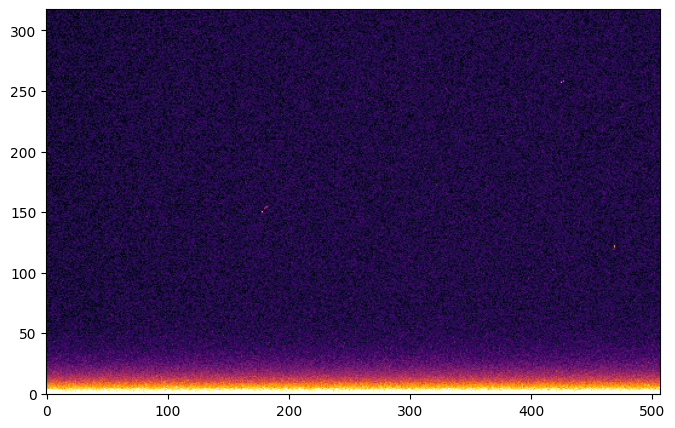

In [ ]:
quantile_imshow(images["BIAS 25"].T)

In [ ]:
def bias_model(x,y,/,m=0,b=1000,A=300,c=100,n=1):
    return m*x + b + n*x**2 + A*np.exp(-y/c)
BiasModel = custom_model(bias_model)
bias_model = BiasModel()

bias = images["BIAS 25"]
X,Y = np.mgrid[:bias.shape[0],:bias.shape[1]]
bias_model = fitter(bias_model,X,Y,bias)(X,Y)

In [ ]:
flat1 = images["FLAT V 5"]
flat1 -= bias_model
flat1 /= flat1.mean()

flat2 = images["FLAT B 5"]
flat2 -= bias_model
flat2 /= flat2.mean()

In [ ]:
img1 = images["V 1"] - bias_model
img1 /= flat1

img2 = images["V 2"] - bias_model
img2 /= flat1

img3 = images["B 1"] - bias_model
img3 /= flat2

img4 = images["B 2"] - bias_model
img4 /= flat2

In [ ]:
img1.shape,img2.shape,img3.shape,img4.shape

((507, 318), (507, 318), (507, 318), (507, 318))

In [ ]:
from photutils.utils import calc_total_error
background = np.sqrt(25)*np.std(bias-bias_model)
background_img = np.ones_like(bias)*background
img_err = calc_total_error(img1, background_img,10.5)

## Source finding

### Masking

In [ ]:
X,Y = np.mgrid[:img1.shape[0],:img1.shape[1]]

In [ ]:
mask = (X>15) & (X<470) & (Y>10) & (Y<295)

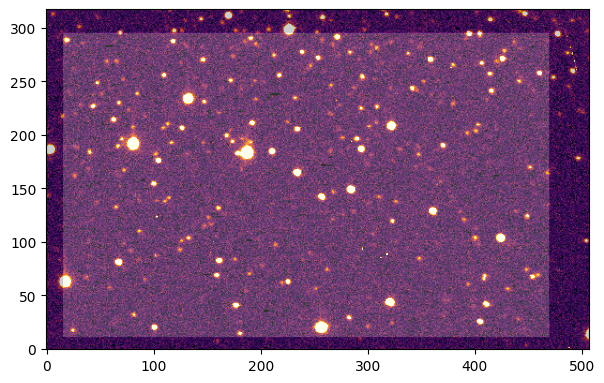

In [207]:
plt.figure(figsize=(7,7))
quantile_imshow(img1.T)#,vmin=300,vmax=600)
plt.imshow(mask.T,alpha=0.2)

### Centroids

In [ ]:
from skimage.feature import peak_local_max
from photutils.centroids import centroid_sources, centroid_quadratic # can be any of centroid_1dg, centroid_2dg, centroid_com, centroid_quadratic

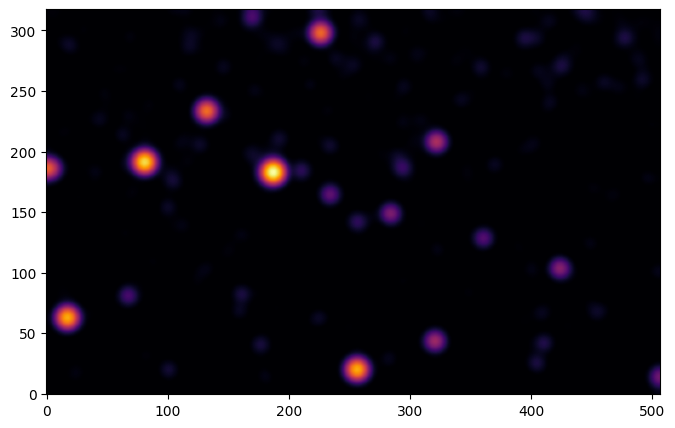

In [208]:
plt.imshow(ndi.gaussian_filter(img1,5).T,vmin=50,norm="log")

In [ ]:
peaks1 = peak_local_max(
    ndi.gaussian_filter(img1,5),
    threshold_abs=60,
    labels=mask*1,
    min_distance=7,
    exclude_border=15
)
peaks2 = peak_local_max(
    ndi.gaussian_filter(img2,5),
    threshold_abs=67,
    labels=mask*1,
    min_distance=7,
    exclude_border=15
)
peaks3 = peak_local_max(
    ndi.gaussian_filter(img3,5),
    threshold_abs=60,
    labels=mask*1,
    min_distance=7,
    exclude_border=15
)
peaks4 = peak_local_max(
    ndi.gaussian_filter(img4,5),
    threshold_abs=60,
    labels=mask*1,
    min_distance=7,
    exclude_border=15
)

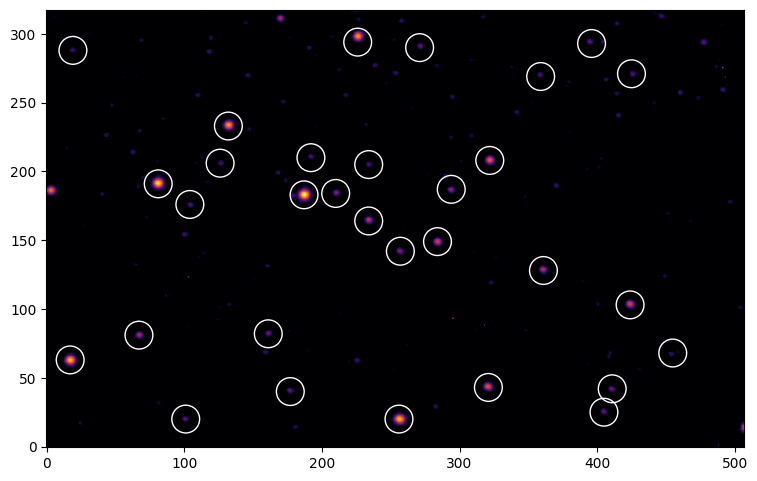

In [212]:
plt.figure(figsize=(9,9))
plt.imshow(img1.T,vmin=70,norm="log")
plt.scatter(*peaks1.T,fc="none",ec="w",s=400)

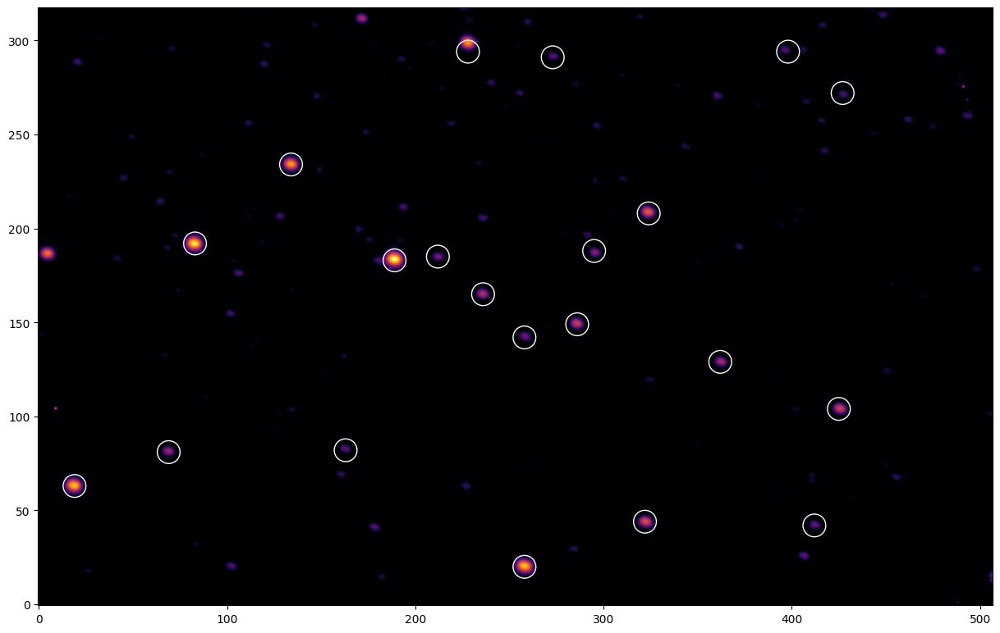

In [ ]:
plt.figure(figsize=(15,15))
plt.imshow(img2.T,vmin=70,norm="log")
plt.scatter(*peaks2.T,fc="none",ec="w",s=400)

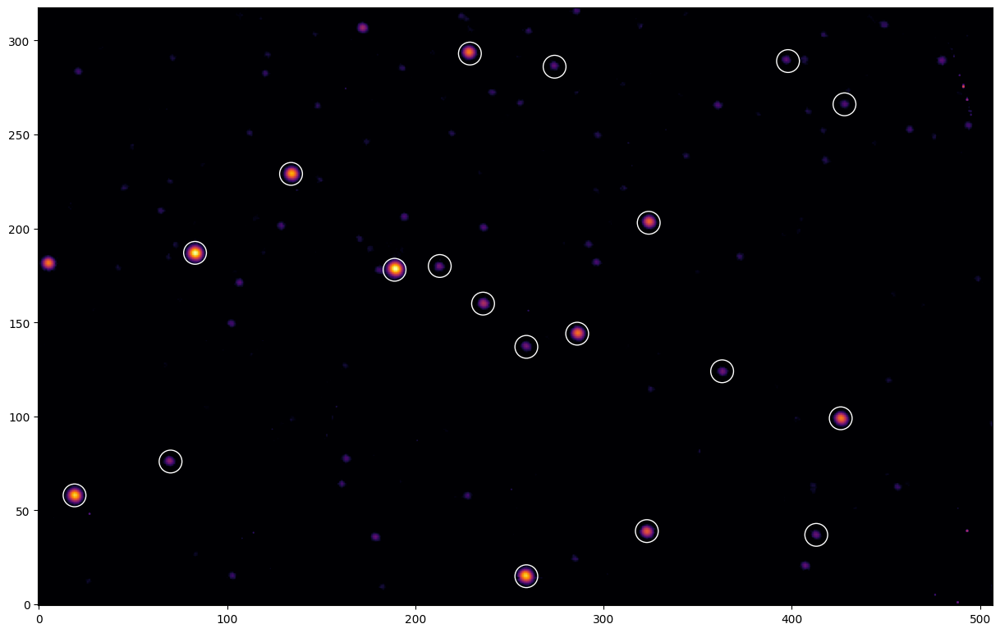

In [ ]:
plt.figure(figsize=(15,15))
plt.imshow(img3.T,vmin=70,norm="log")
plt.scatter(*peaks3.T,fc="none",ec="w",s=400)

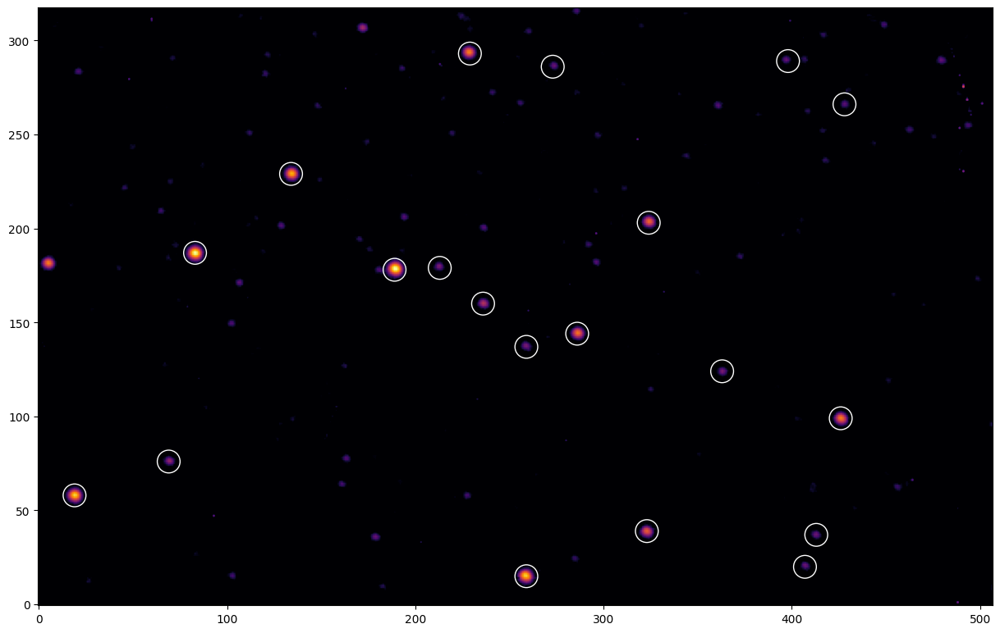

In [ ]:
plt.figure(figsize=(15,15))
plt.imshow(img4.T,vmin=70,norm="log")
plt.scatter(*peaks4.T,fc="none",ec="w",s=400)

In [ ]:
centroids1 = np.array(
    centroid_sources((img1-img1.mean()).T,*peaks1.T,centroid_func=centroid_quadratic,box_size=9)
).T
centroids2 = np.array(
    centroid_sources((img2-img2.mean()).T,*peaks2.T,centroid_func=centroid_quadratic,box_size=9)
).T
centroids3 = np.array(
    centroid_sources((img3-img3.mean()).T,*peaks3.T,centroid_func=centroid_quadratic,box_size=9)
).T
centroids4 = np.array(
    centroid_sources((img4-img4.mean()).T,*peaks4.T,centroid_func=centroid_quadratic,box_size=9)
).T

In [ ]:
distances1 = np.hypot(*(peaks1-centroids1).T)

distances2 = np.hypot(*(peaks2-centroids2).T)

distances3 = np.hypot(*(peaks3-centroids3).T)

distances4 = np.hypot(*(peaks4-centroids4).T)

In [ ]:
distances1

array([0.21098386, 0.06704233, 0.26764417, 0.28078886, 0.27512109, 4.        , 0.10259808, 0.48805726, 0.54561566,
       0.25972405, 0.27383499, 0.38073527, 0.30503269, 0.79107571, 0.42023381, 0.57218225, 0.64957925, 1.71133149,
       1.07201563, 0.17048924, 0.93161629, 0.30396154, 0.63082429, 0.87180766, 0.20689918, 0.3577951 , 0.95171265,
       0.24338308, 1.48376055, 0.74819804, 0.1892669 ])

In [ ]:
distances2

array([0.28080256, 0.37130066, 0.28730136, 0.22036429, 0.10249599, 4.        , 0.5912986 , 0.22040283, 0.4752492 ,
       0.33221334, 0.22951911, 0.32888746, 0.25233648, 1.13713082, 0.34511   , 0.58029173, 0.24186363, 1.05192569,
       0.2380493 , 1.75060874, 0.71126846])

In [ ]:
distances3

array([0.40974075, 0.35557357, 0.28942697, 0.19483382, 0.37403516, 0.24893964, 0.50688825, 0.25868214, 0.26640545,
       0.23068504, 0.23844798, 0.41112209, 0.12041051, 0.46553778, 0.31041401, 1.09227024, 0.19044649, 0.13225152,
       0.24521061])

In [ ]:
distances4

array([0.38517309, 0.34522885, 0.3498212 , 0.18250954, 0.38555411, 0.20013217, 0.45590467, 0.2318441 , 0.26647285,
       0.18160243, 0.24184993, 0.57216696, 0.17831107, 0.62786454, 0.24040292, 0.14958194, 1.06787442, 0.22547212,
       0.74283961, 0.63269864])

Text(0.5, 0, 'Distance correction [pix]')

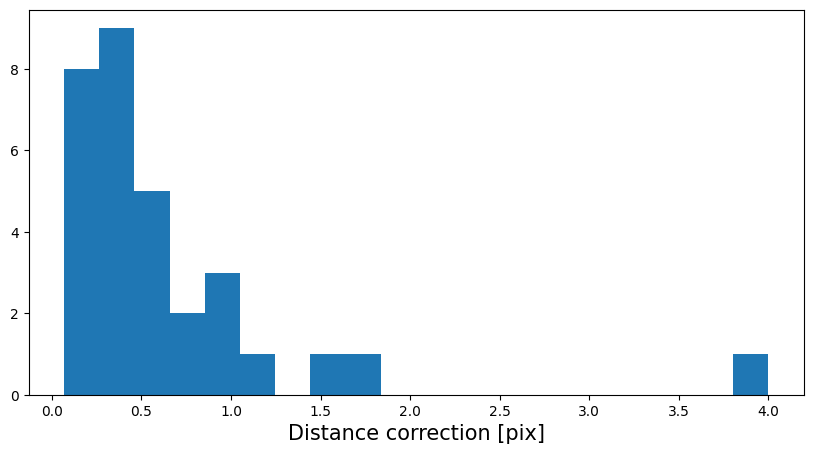

In [ ]:
plt.hist(distances1,bins=20);
plt.xlabel("Distance correction [pix]")

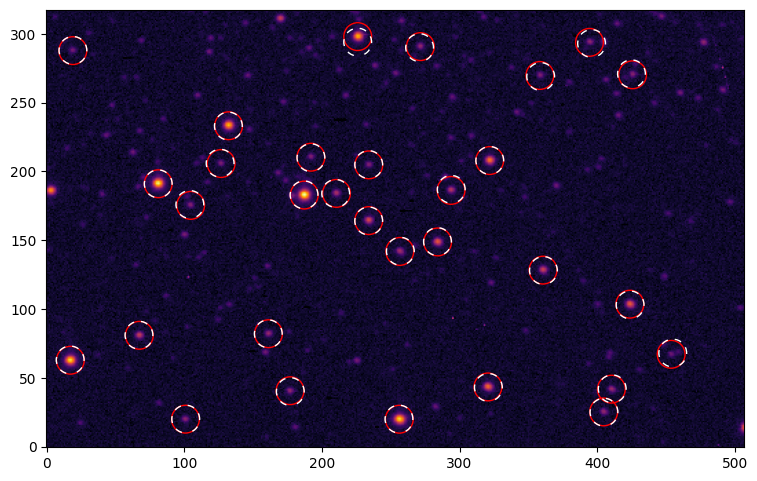

In [213]:
plt.figure(figsize=(9,9))
plt.imshow(img1.T,vmin=30,norm="log")
plt.scatter(*centroids1.T,fc="none",ec="r",s=400)
plt.scatter(*peaks1.T,fc="none",ec="w",s=400,linestyle=(5,(5,5)))

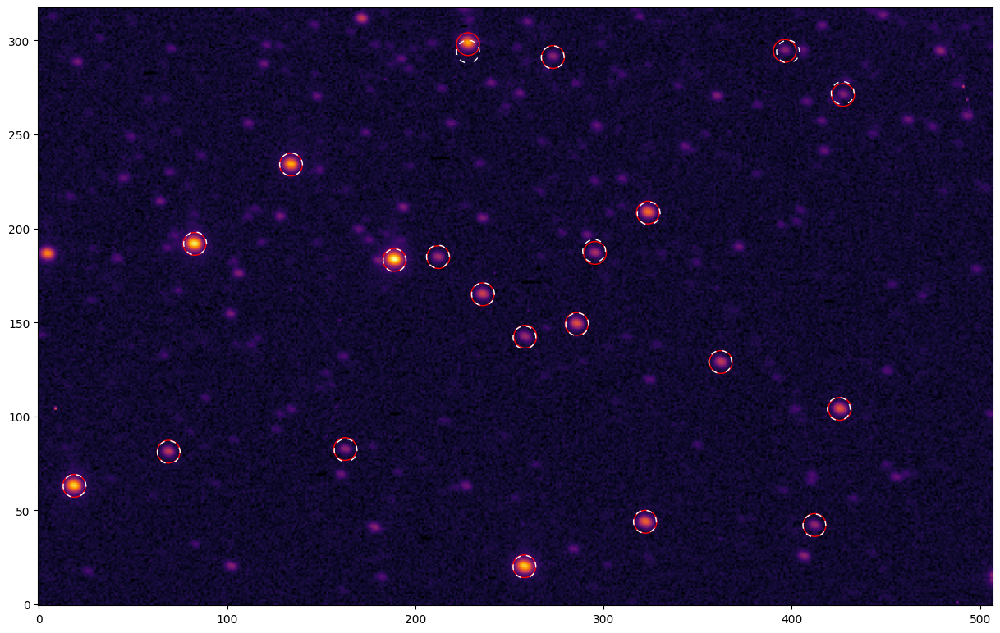

In [ ]:
plt.figure(figsize=(15,15))
plt.imshow(img2.T,vmin=30,norm="log")
plt.scatter(*centroids2.T,fc="none",ec="r",s=400)
plt.scatter(*peaks2.T,fc="none",ec="w",s=400,linestyle=(5,(5,5)))

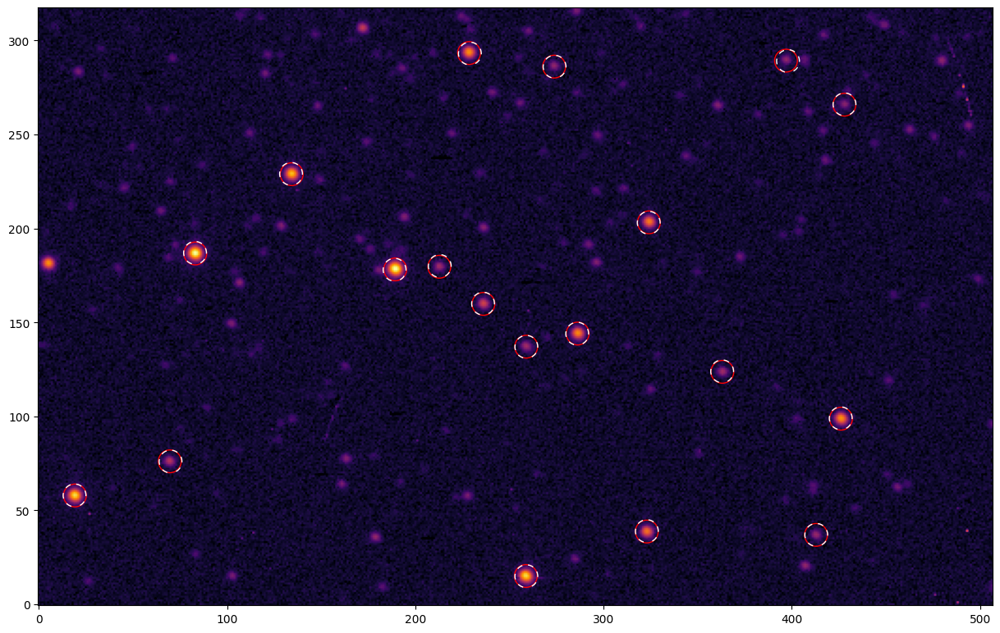

In [ ]:
plt.figure(figsize=(15,15))
plt.imshow(img3.T,vmin=30,norm="log")
plt.scatter(*centroids3.T,fc="none",ec="r",s=400)
plt.scatter(*peaks3.T,fc="none",ec="w",s=400,linestyle=(5,(5,5)))

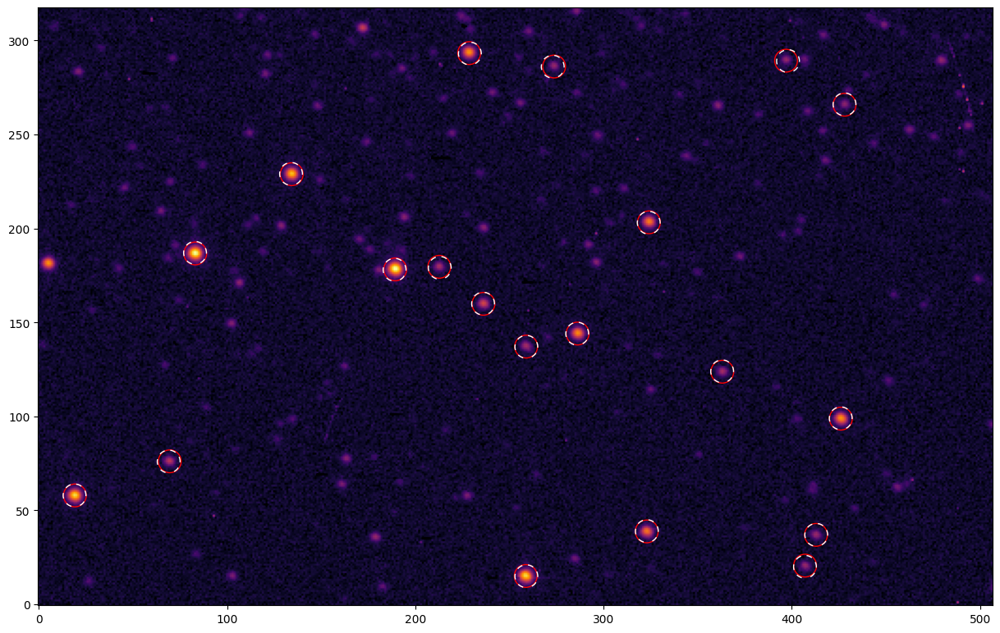

In [ ]:
plt.figure(figsize=(15,15))
plt.imshow(img4.T,vmin=30,norm="log")
plt.scatter(*centroids4.T,fc="none",ec="r",s=400)
plt.scatter(*peaks4.T,fc="none",ec="w",s=400,linestyle=(5,(5,5)))

## Radial profile and FWHM

In [ ]:
from photutils.aperture import CircularAperture, ApertureStats
from photutils.profiles import RadialProfile
from astropy.modeling.models import Gaussian1D,Voigt1D,Const1D
from astropy.modeling.fitting import LevMarLSQFitter
fitter = LevMarLSQFitter(calc_uncertainties=True)

In [ ]:
model = Const1D(100) + Gaussian1D(5e3,0,1.5)
model.mean_1.fixed = True

In [ ]:
radii = np.arange(0,10,1)

profile1 = RadialProfile(img1.T,centroids1[0],radii)
fitted_model1 = fitter(model,profile1.radius,profile1.profile)

profile2 = RadialProfile(img2.T,centroids2[0],radii)
fitted_model2 = fitter(model,profile2.radius,profile2.profile)

profile3 = RadialProfile(img3.T,centroids3[0],radii)
fitted_model3 = fitter(model,profile3.radius,profile3.profile)

profile4 = RadialProfile(img4.T,centroids4[0],radii)
fitted_model4 = fitter(model,profile4.radius,profile4.profile)

In [ ]:
params1 = []
params_std1 = []
for c in centroids1:
    try:
        profile1 = RadialProfile(img1.T,c,radii)
        fitted_model1 = fitter(model,profile1.radius,profile1.profile)
        params_std1.append(np.sqrt(np.diag(fitter.fit_info["param_cov"])))
        params1.append(fitted_model1.parameters)
    except ValueError:
        pass
    #plt.plot(profile.radius,profile.gaussian_profile)
    #plt.plot(profile.radius,profile.profile,". k")
    #plt.show()
    #plt.close()

params1 = np.asarray(params1)
params_std1 = np.asarray(params_std1)

params2 = []
params_std2 = []
for c in centroids2:
    try:
        profile2 = RadialProfile(img2.T,c,radii)
        fitted_model2 = fitter(model,profile2.radius,profile2.profile)
        params_std2.append(np.sqrt(np.diag(fitter.fit_info["param_cov"])))
        params2.append(fitted_model2.parameters)
    except ValueError:
        pass
    #plt.plot(profile.radius,profile.gaussian_profile)
    #plt.plot(profile.radius,profile.profile,". k")
    #plt.show()
    #plt.close()

params2 = np.asarray(params2)
params_std2 = np.asarray(params_std2)

params3 = []
params_std3 = []
for c in centroids3:
    try:
        profile3 = RadialProfile(img3.T,c,radii)
        fitted_model3 = fitter(model,profile3.radius,profile3.profile)
        params_std3.append(np.sqrt(np.diag(fitter.fit_info["param_cov"])))
        params3.append(fitted_model3.parameters)
    except ValueError:
        pass
    #plt.plot(profile.radius,profile.gaussian_profile)
    #plt.plot(profile.radius,profile.profile,". k")
    #plt.show()
    #plt.close()

params3 = np.asarray(params3)
params_std3 = np.asarray(params_std3)

params4 = []
params_std4 = []
for c in centroids4:
    try:
        profil4 = RadialProfile(img4.T,c,radii)
        fitted_model4 = fitter(model,profile4.radius,profile4.profile)
        params_std4.append(np.sqrt(np.diag(fitter.fit_info["param_cov"])))
        params4.append(fitted_model4.parameters)
    except ValueError:
        pass
    #plt.plot(profile.radius,profile.gaussian_profile)
    #plt.plot(profile.radius,profile.profile,". k")
    #plt.show()
    #plt.close()

params4 = np.asarray(params4)
params_std4 = np.asarray(params_std4)

In [ ]:
x1 = np.log10(params1.T[1])
y1 = 2*np.sqrt(2*np.log(2))*params1.T[3]
dx1 = params_std1.T[1]/params1.T[1] / np.log(10)
dy1 = 2*np.sqrt(2*np.log(2))*params_std1.T[2]


samples1 = np.random.normal(loc=y1,scale=dy1,size=(10_000,len(y1)))
means1 = samples1.mean(axis=1)

FWHM1 = means1.mean()
FWHM_err1 = means1.std()

In [ ]:
x2 = np.log10(params2.T[1])
y2 = 2*np.sqrt(2*np.log(2))*params2.T[3]
dx2 = params_std2.T[1]/params2.T[1] / np.log(10)
dy2 = 2*np.sqrt(2*np.log(2))*params_std2.T[2]


samples2 = np.random.normal(loc=y2,scale=dy2,size=(10_000,len(y2)))
means2 = samples2.mean(axis=1)

FWHM2 = means2.mean()
FWHM_err2 = means2.std()

In [ ]:
x3 = np.log10(params3.T[1])
y3 = 2*np.sqrt(2*np.log(2))*params3.T[3]
dx3 = params_std3.T[1]/params3.T[1] / np.log(10)
dy3 = 2*np.sqrt(2*np.log(2))*params_std3.T[2]


samples3 = np.random.normal(loc=y3,scale=dy3,size=(10_000,len(y3)))
means3 = samples3.mean(axis=1)

FWHM3 = means3.mean()
FWHM_err3 = means3.std()

In [ ]:
x4 = np.log10(params4.T[1])
y4 = 2*np.sqrt(2*np.log(2))*params4.T[3]
dx4 = params_std4.T[1]/params4.T[1] / np.log(10)
dy4 = 2*np.sqrt(2*np.log(2))*params_std4.T[2]


samples4 = np.random.normal(loc=y4,scale=dy4,size=(10_000,len(y4)))
means4 = samples4.mean(axis=1)

FWHM4 = means4.mean()
FWHM_err4 = means4.std()

Text(0.5, 1.0, 'FWHM mean = $3.287\\pm0.010$')

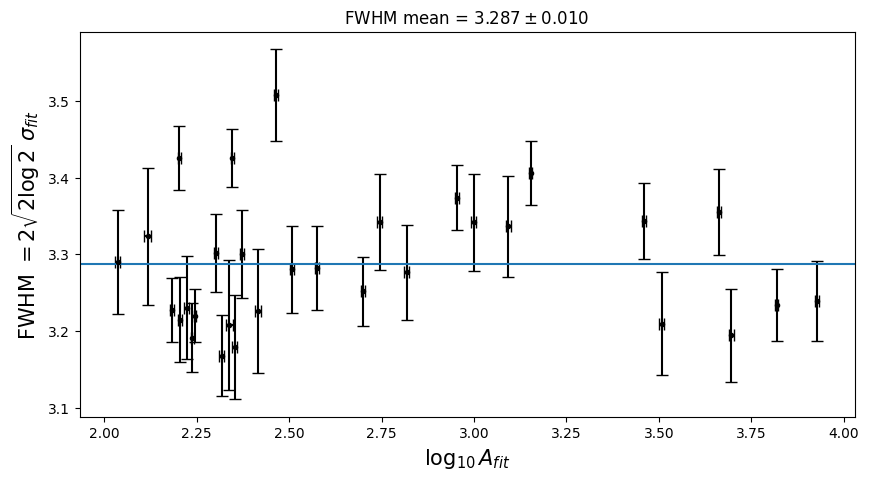

In [ ]:
plt.errorbar(x1,y1,dy1,dx1,fmt=". k",capsize=4)

plt.xlabel("$\\log_{10} A_{fit}$")
plt.ylabel("FWHM $= 2\\sqrt{2\\log 2}\\;\\sigma_{fit}$")

plt.axhline(FWHM1)
plt.title(f"FWHM mean = ${FWHM1:.3f}\\pm{FWHM_err1:.3f}$")

Text(0.5, 1.0, 'FWHM mean = $3.712\\pm0.010$')

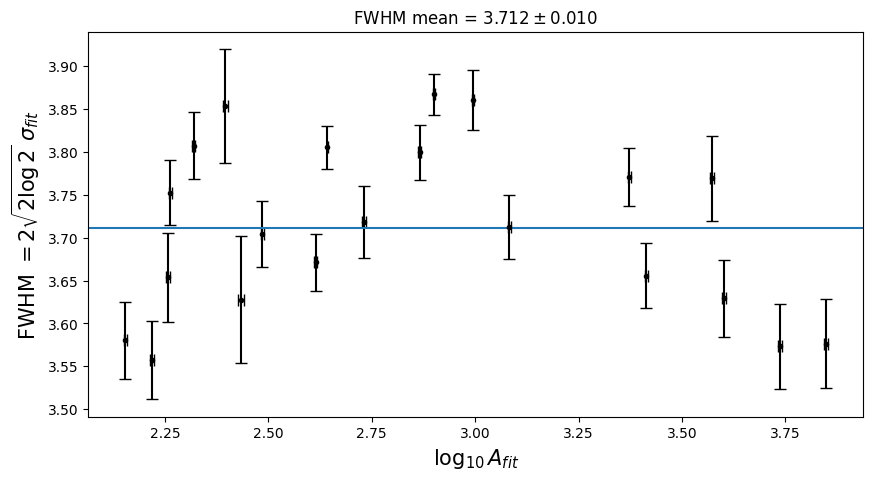

In [ ]:
plt.errorbar(x2,y2,dy2,dx2,fmt=". k",capsize=4)

plt.xlabel("$\\log_{10} A_{fit}$")
plt.ylabel("FWHM $= 2\\sqrt{2\\log 2}\\;\\sigma_{fit}$")

plt.axhline(FWHM2)
plt.title(f"FWHM mean = ${FWHM2:.3f}\\pm{FWHM_err2:.3f}$")

Text(0.5, 1.0, 'FWHM mean = $3.652\\pm0.012$')

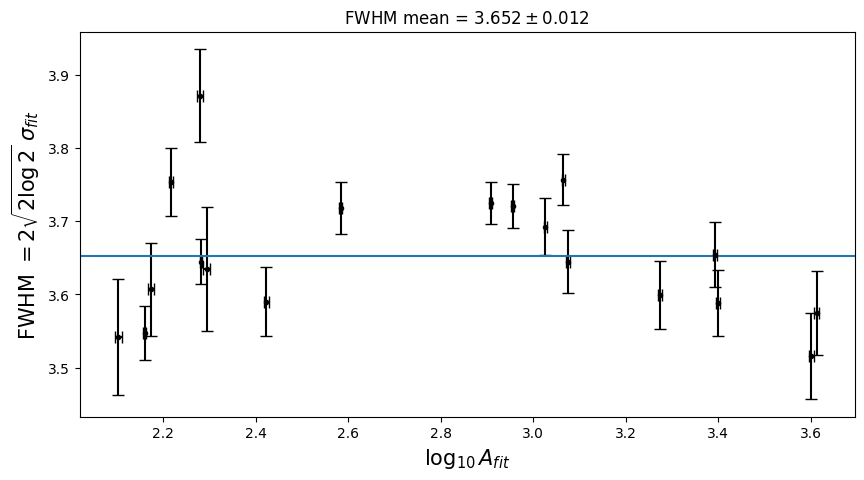

In [ ]:
plt.errorbar(x3,y3,dy3,dx3,fmt=". k",capsize=4)

plt.xlabel("$\\log_{10} A_{fit}$")
plt.ylabel("FWHM $= 2\\sqrt{2\\log 2}\\;\\sigma_{fit}$")

plt.axhline(FWHM3)
plt.title(f"FWHM mean = ${FWHM3:.3f}\\pm{FWHM_err3:.3f}$")

Text(0.5, 1.0, 'FWHM mean = $3.321\\pm0.015$')

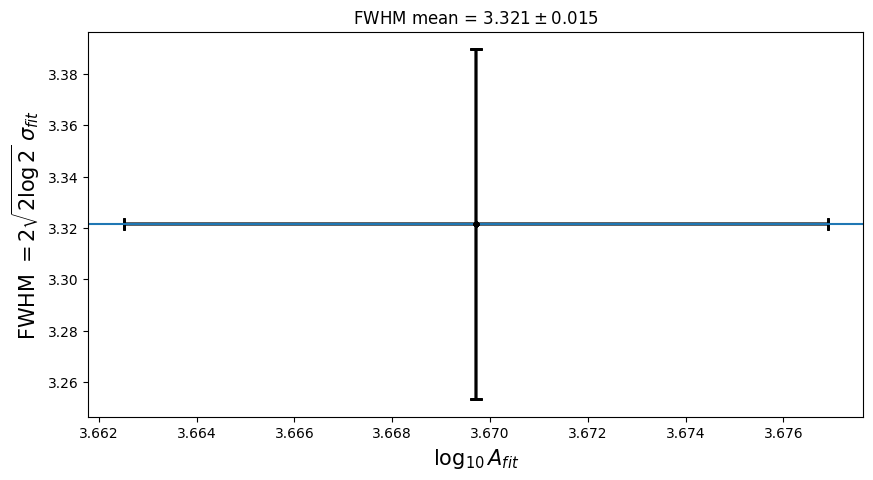

In [ ]:
plt.errorbar(x4,y4,dy4,dx4,fmt=". k",capsize=4)

plt.xlabel("$\\log_{10} A_{fit}$")
plt.ylabel("FWHM $= 2\\sqrt{2\\log 2}\\;\\sigma_{fit}$")

plt.axhline(FWHM4)
plt.title(f"FWHM mean = ${FWHM4:.3f}\\pm{FWHM_err4:.3f}$")

In [ ]:
centroids1

array([[187.13814438, 182.84053113],
       [ 80.98357611, 191.06499946],
       [256.24328594,  19.88844126],
       [ 17.14102858,  62.75719694],
       [132.16765521, 233.21813607],
       [226.        , 298.        ],
       [321.93479944, 207.92078351],
       [320.67040964,  43.35995845],
       [423.82603325, 103.51713829],
       [284.08018925, 148.75296504],
       [234.02068457, 164.27305265],
       [360.73514857, 128.27351978],
       [ 67.28490983,  80.89104435],
       [293.8479083 , 186.22368247],
       [256.60328741, 141.86137975],
       [210.56952239, 184.05510695],
       [410.39553175,  41.76215271],
       [394.49692671, 293.81818468],
       [425.76672858, 270.25077053],
       [161.16130813,  82.05519301],
       [271.55665436, 290.74702398],
       [404.78364575,  25.21350282],
       [176.84436031,  40.61132281],
       [104.5675093 , 175.33819807],
       [100.80296732,  19.93687003],
       [191.9677133 , 210.35633538],
       [358.40777028, 269.74499726],
 

In [ ]:
from sklearn.neighbors import NearestNeighbors

In [ ]:
minimum_distance1 = NearestNeighbors(n_neighbors=2).fit(centroids1).kneighbors(centroids1)[0][:,1].min()
minimum_distance1

17.474297625146622

In [ ]:
minimum_distance2 = NearestNeighbors(n_neighbors=2).fit(centroids2).kneighbors(centroids2)[0][:,1].min()
minimum_distance2

23.370842648494257

In [ ]:
minimum_distance3 = NearestNeighbors(n_neighbors=2).fit(centroids3).kneighbors(centroids3)[0][:,1].min()
minimum_distance3

23.454037427852082

In [ ]:
minimum_distance4 = NearestNeighbors(n_neighbors=2).fit(centroids4).kneighbors(centroids4)[0][:,1].min()
minimum_distance4

17.348008950551055

In [ ]:
from photutils.aperture import CircularAnnulus

In [ ]:
sky_apertures1 = CircularAnnulus(centroids1,2*FWHM1,0.7*(minimum_distance1-FWHM1))
star_apertures1 = CircularAperture(centroids1,FWHM1)

In [ ]:
sky_apertures2 = CircularAnnulus(centroids2,2*FWHM2,0.7*(minimum_distance2-FWHM2))
star_apertures2 = CircularAperture(centroids2,FWHM2)

In [ ]:
sky_apertures3 = CircularAnnulus(centroids3,2*FWHM3,0.7*(minimum_distance3-FWHM3))
star_apertures3 = CircularAperture(centroids3,FWHM3)

In [ ]:
sky_apertures4 = CircularAnnulus(centroids4,2*FWHM4,0.7*(minimum_distance4-FWHM4))
star_apertures4 = CircularAperture(centroids4,FWHM4)

In [ ]:
sky_apertures1.area,star_apertures1.area

(174.02148032149583, 33.95149558476842)

In [ ]:
sky_apertures2.area,star_apertures2.area

(421.80246037178347, 43.28338825146462)

In [ ]:
sky_apertures3.area,star_apertures3.area

(436.03787469513475, 41.89764976545564)

In [ ]:
sky_apertures4.area,star_apertures4.area

(164.23720532677217, 34.65725850204179)

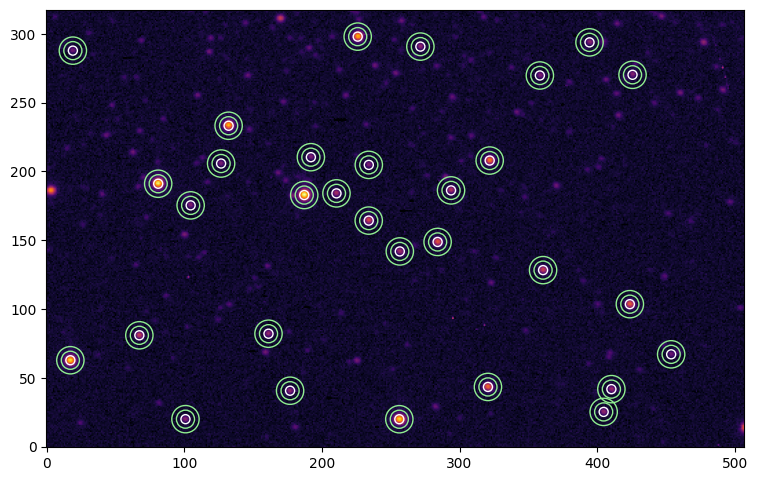

In [214]:
plt.figure(figsize=(9,9))
plt.imshow(img1.T,vmin=30,norm="log");
sky_apertures1.plot(color="lightgreen");
star_apertures1.plot(color="w");

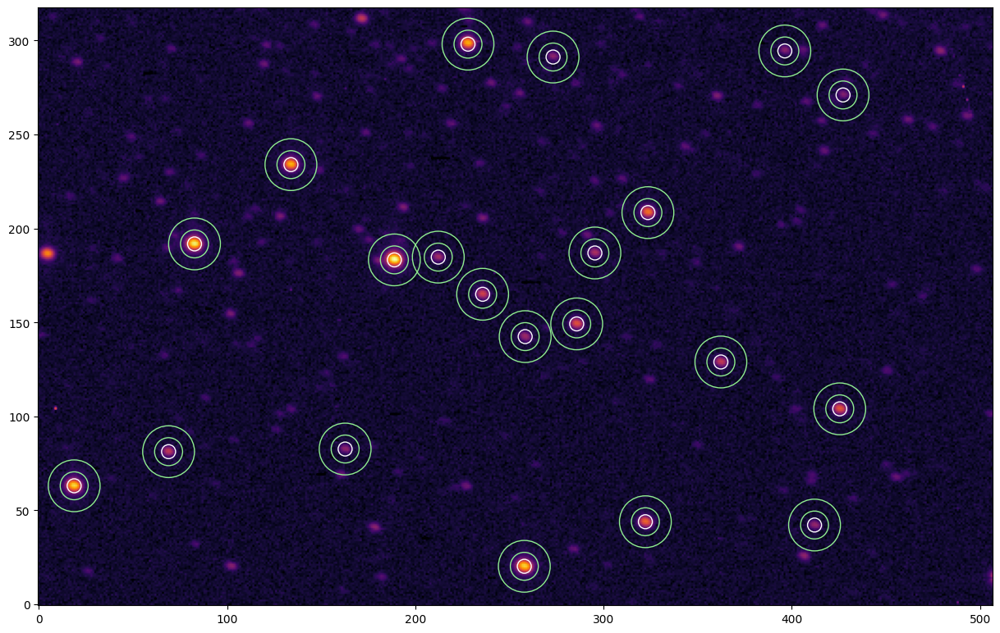

In [ ]:
plt.figure(figsize=(15,15))
plt.imshow(img2.T,vmin=30,norm="log");
sky_apertures2.plot(color="lightgreen");
star_apertures2.plot(color="w");

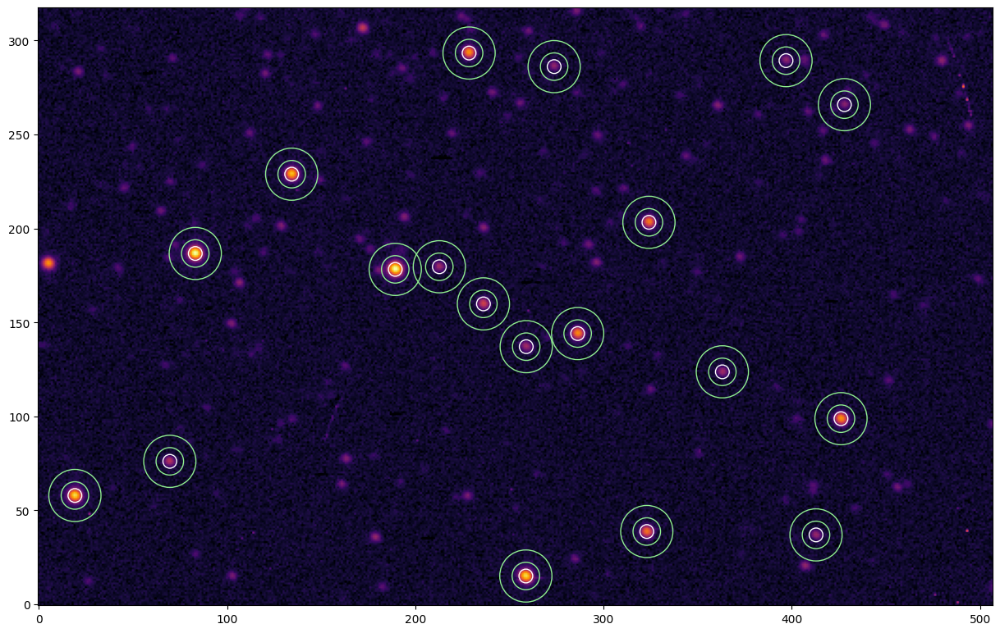

In [ ]:
plt.figure(figsize=(15,15))
plt.imshow(img3.T,vmin=30,norm="log");
sky_apertures3.plot(color="lightgreen");
star_apertures3.plot(color="w");

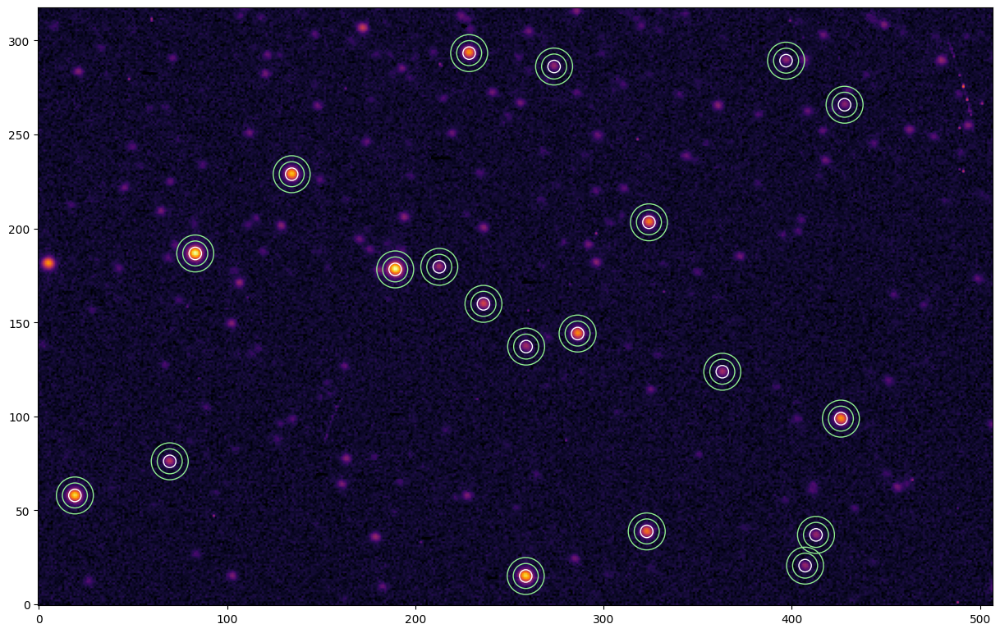

In [ ]:
plt.figure(figsize=(15,15))
plt.imshow(img4.T,vmin=30,norm="log");
sky_apertures4.plot(color="lightgreen");
star_apertures4.plot(color="w");

In [ ]:
sky_values1 = ApertureStats(img1.T,sky_apertures1).median
star_values1 = ApertureStats(img1.T,star_apertures1).sum / star_apertures1.area

In [ ]:
sky_values2 = ApertureStats(img2.T,sky_apertures2).median
star_values2 = ApertureStats(img2.T,star_apertures2).sum / star_apertures2.area

In [ ]:
sky_values3 = ApertureStats(img3.T,sky_apertures3).median
star_values3 = ApertureStats(img3.T,star_apertures3).sum / star_apertures3.area

In [ ]:
sky_values4 = ApertureStats(img4.T,sky_apertures4).median
star_values4 = ApertureStats(img4.T,star_apertures4).sum / star_apertures4.area

In [ ]:
mag_ins1 = -2.5 * np.log10((star_values1 - sky_values1) / headers["V 1"]["EXPTIME"]) + 25
mag_ins1

array([20.76116837, 21.0452488 , 21.36924085, 21.36040831, 21.81981182, 21.882996  , 22.62861648, 22.79553155,
       23.03434129, 23.13845083, 23.5134043 , 23.66230797, 23.83382736, 24.13058922, 24.29789865, 24.29897535,
       24.53297295, 24.80597563, 24.93994101, 24.61760495, 24.71620462, 24.64079516, 24.7350989 , 24.98908404,
       24.79447462, 25.08665042, 25.01647079, 24.98563471, 25.40859449, 25.1244912 , 25.24533783])

In [ ]:
mag_ins2 = -2.5 * np.log10((star_values2 - sky_values2) / headers["V 2"]["EXPTIME"]) + 25
mag_ins2

array([20.99734926, 21.28577491, 21.60075116, 21.59742894, 22.05702891, 22.11104264, 22.86407645, 23.02256459,
       23.26506409, 23.371091  , 23.73519558, 23.93158871, 24.04800288, 24.37424565, 24.5114514 , 24.51689745,
       24.7474307 , 25.12131276, 24.93022036, 25.05312517, 24.90605795])

In [ ]:
mag_ins3 = -2.5 * np.log10((star_values3 - sky_values3) / headers["B 1"]["EXPTIME"]) + 25
mag_ins3

array([22.30965963, 22.36835313, 22.83131479, 22.843942  , 23.15490544, 23.61559005, 23.63905333, 23.73463402,
       23.8992099 , 24.02003326, 24.84421087, 25.28727502, 25.524635  , 25.59337241, 25.62076994, 25.91853558,
       25.98877929, 25.7418373 , 25.87859313])

In [ ]:
mag_ins4 = -2.5 * np.log10((star_values4 - sky_values4) / headers["B 2"]["EXPTIME"]) + 25
mag_ins4

array([22.12709287, 22.19290493, 22.65795178, 22.66564375, 22.97569493, 23.44209291, 23.44759004, 23.5661957 ,
       23.72667126, 23.84971134, 24.6692354 , 25.10466049, 25.36562986, 25.38538546, 25.44495578, 25.56625819,
       25.77503584, 25.86985008, 25.73151452, 25.65210781])

In [ ]:
from photutils.aperture import aperture_photometry

In [ ]:
aperture_photometry(img1.T,star_apertures1)

id,xcenter,ycenter,aperture_sum
,pix,pix,
int64,float64,float64,float64
1,187.13814437602102,182.84053113303924,103344.5854051519
2,80.98357610911367,191.06499945636884,79891.04471654269
3,256.24328593939964,19.888441258282604,59691.25317399237
4,17.141028576154365,62.75719694393659,60204.78704106206
5,132.16765521273743,233.2181360685793,39968.67621019184
6,226.0,298.0,37766.902849200604
7,321.93479943846864,207.9207835069584,19816.243919539123
8,320.67040963951905,43.359958445832014,17217.356584162957


In [ ]:
aperture_photometry(img2.T,star_apertures2)

id,xcenter,ycenter,aperture_sum
,pix,pix,
int64,float64,float64,float64
1,188.88710947328798,183.25711049590558,106182.65532715821
2,82.71966111877842,191.75653688478675,81942.27526303474
3,257.91535107658194,20.274548048322746,61746.0054906111
4,18.802642344560024,63.0980325335444,61982.77557548821
5,133.94016228420037,233.916784166596,41353.72234258645
6,228.0,298.0,39371.78680035731
7,323.571487610537,208.40744468025264,20698.516032761916
8,322.2197413010456,43.98293637694141,18137.196540120316


In [ ]:
aperture_photometry(img3.T,star_apertures3)

id,xcenter,ycenter,aperture_sum
,pix,pix,
int64,float64,float64,float64
1,189.35505278611714,178.20451160649665,62110.13117853532
2,83.13076642071617,186.6693450297494,58903.55779493223
3,258.73188393608194,15.109003428570364,39052.68166175858
4,19.184164301653954,57.936409687431066,38622.342185159556
5,134.33769771241145,228.83918160273615,29506.50130883733
6,426.1324953101411,98.7892491102708,19904.005702787497
7,228.57349170676682,293.27390942640477,19579.40231214063
8,286.2510467369928,144.0623857952016,18048.21397710651


In [ ]:
aperture_photometry(img4.T,star_apertures4)

id,xcenter,ycenter,aperture_sum
,pix,pix,
int64,float64,float64,float64
1,189.3318021994778,178.19561597934478,60623.335028886846
2,83.11798280991589,186.67555737341905,57107.47153029398
3,258.6732530030806,15.124945062427448,37693.30803295942
4,19.17800567363208,57.95970466723022,37446.203830077524
5,134.34604708137542,228.82999002445771,28592.40006500054
6,426.0810625832586,98.81701982919107,19082.707426802674
7,228.6100888753719,293.2362591414611,18981.65710074846
8,286.21892296769664,144.07631790263758,17225.225612716906


In [ ]:
ApertureStats(img1.T,sky_apertures1).median

array([67.53972418, 61.95298625, 58.10980988, 59.34910535, 54.62489557, 53.2394496 , 50.69103439, 50.09268995,
       49.63371869, 48.63783302, 48.88772914, 47.96658596, 48.93891545, 50.77989629, 48.89368869, 48.34076071,
       48.22614928, 49.91192739, 51.83450507, 47.05223753, 49.29264871, 48.59296572, 48.08039432, 50.06583311,
       46.62132182, 49.34194987, 48.53694894, 47.69350704, 49.29509799, 47.56297896, 49.73582815])

In [ ]:
ApertureStats(img2.T,sky_apertures2).median

array([58.71464031, 57.29028913, 52.98206095, 54.24290112, 53.14127701, 51.14018118, 49.14662678, 48.24587782,
       48.96615169, 47.63874064, 48.65655102, 48.25554135, 48.63914667, 50.44067729, 48.78429869, 47.88039954,
       48.79488943, 50.18830754, 49.84491312, 50.18280617, 48.70272011])

In [ ]:
ApertureStats(img3.T,sky_apertures3).median

array([52.48657236, 51.2014762 , 47.68376061, 47.63877653, 47.77561578, 45.58032586, 47.01454516, 45.8870937 ,
       45.44710644, 45.06195003, 45.22787053, 44.69021972, 45.1902718 , 46.2614584 , 44.78404732, 46.23355419,
       45.71893825, 45.15600622, 46.04298866])

In [ ]:
ApertureStats(img4.T,sky_apertures4).median

array([57.4439521 , 55.49871242, 50.07243524, 50.26696567, 50.71533645, 46.71246313, 46.3415808 , 47.54405744,
       46.65288882, 45.75661785, 45.84204141, 44.88262742, 46.3446659 , 45.1643016 , 46.84741814, 44.26425509,
       46.80288929, 47.79034513, 47.5474159 , 44.63653731])

In [ ]:
ApertureStats(img1.T,sky_apertures1).biweight_location

array([67.06239788, 62.10899989, 58.10409071, 58.84247418, 54.70102255, 53.81380066, 50.47032505, 50.12374314,
       49.30822192, 48.90814121, 48.78262788, 48.27083185, 48.88013212, 50.4619235 , 48.62943948, 47.99187172,
       48.42094307, 49.60349932, 51.58041782, 47.23468934, 49.32822952, 48.35324961, 48.1630677 , 49.77191144,
       46.81173761, 49.33938092, 48.02017634, 47.98808114, 49.07082974, 47.88236965, 49.62664017])

In [ ]:
ApertureStats(img2.T,sky_apertures2).biweight_location

array([58.86796092, 57.39146674, 52.99350311, 54.1239414 , 52.93801245, 50.88357177, 49.35176305, 48.28300501,
       48.95117298, 48.00915925, 48.45907375, 48.140227  , 48.79106623, 50.36501381, 48.71078984, 48.04949734,
       48.57605814, 49.98886686, 49.89702623, 49.64023211, 48.65928089])

In [ ]:
ApertureStats(img3.T,sky_apertures3).biweight_location

array([51.87688213, 51.08280216, 47.75086711, 48.13529859, 48.01755652, 45.53936259, 46.68263016, 45.73498263,
       45.61285097, 45.26427412, 45.28836029, 44.94582813, 45.48390985, 46.04479642, 44.85147611, 45.99375538,
       45.68912516, 45.21024339, 46.13039023])

In [ ]:
ApertureStats(img4.T,sky_apertures4).biweight_location

array([56.67119599, 55.5805582 , 50.0925033 , 50.38579916, 50.38182453, 46.89269628, 46.84913752, 47.79840795,
       46.50809371, 46.22241459, 45.7572496 , 45.41647264, 45.94381843, 45.22784917, 46.3765996 , 44.35273169,
       46.70146227, 47.60894059, 47.06873127, 45.07645038])

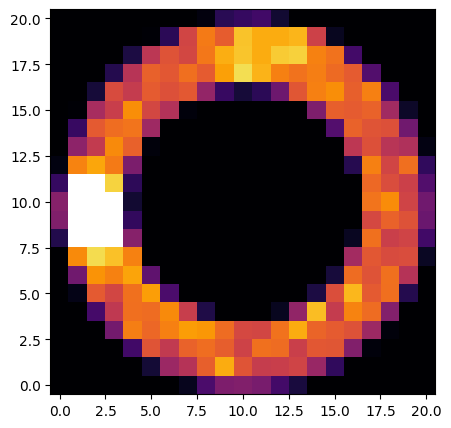

In [ ]:
plt.imshow(sky_apertures1[0].to_mask().multiply(img1.T),vmax=100)

In [ ]:
sky1 = sky_apertures1[0].to_mask().get_values(img1.T)

In [ ]:
headers["V 1"]

XTENSION= 'IMAGE   '           / Image extension                                
BITPIX  =                   16 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                  318                                                  
NAXIS2  =                  507                                                  
PCOUNT  =                    0 / number of parameters                           
GCOUNT  =                    1 / number of groups                               
OBJECT  = 'M-92 V  '            /                                               
ORIGIN  = 'KPNO-IRAF'           /                                               
DATE    = '17-09-93'            /                                               
IRAFNAME= 'm92010.imh'          /  NAME OF IRAF IMAGE FILE                      
IRAF-MAX=           1.064900E4  /  DATA MAX                                     
IRAF-MIN=           4.810000

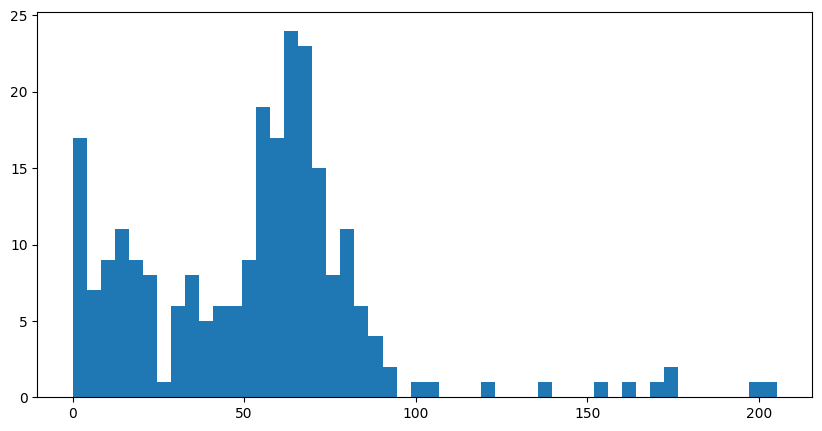

In [ ]:
plt.hist(sky1,50);

In [ ]:
from photutils.utils import calc_total_error

background = np.sqrt(25)*np.std(bias-bias_model)
background_img = np.ones_like(bias)*background

img_err1 = calc_total_error(img1,background_img,10.5)

star_errors1 = [np.linalg.norm( s.to_mask().get_values(img_err1.T)/ star_apertures1.area ) for s in star_apertures1]

img_err2 = calc_total_error(img2,background_img,10.5)

star_errors2 = [np.linalg.norm( s.to_mask().get_values(img_err2.T)/ star_apertures2.area ) for s in star_apertures2]

img_err3 = calc_total_error(img3,background_img,10.5)

star_errors3 = [np.linalg.norm( s.to_mask().get_values(img_err3.T)/ star_apertures3.area ) for s in star_apertures3]

img_err4 = calc_total_error(img4,background_img,10.5)

star_errors4 = [np.linalg.norm( s.to_mask().get_values(img_err4.T)/ star_apertures4.area ) for s in star_apertures4]

In [ ]:
star_errors1

[3.0909288067805054,
 2.7657971529931196,
 2.459201382962383,
 2.4694906558498606,
 2.1137510479450983,
 2.0636227211515723,
 1.680394656083224,
 1.6283080849268021,
 1.5460811020611012,
 1.5124700921357273,
 1.4213534103006848,
 1.3972891652479544,
 1.364320291098936,
 1.323179787202162,
 1.3019878838597843,
 1.299515553337257,
 1.2819386533384833,
 1.2593150778347006,
 1.253017760766794,
 1.2644793207389742,
 1.268190091025663,
 1.2701458584769583,
 1.261173036233531,
 1.251401427968086,
 1.251512322645595,
 1.236629147327298,
 1.2466571880333577,
 1.2409200911691622,
 1.2182254336379204,
 1.2389252920284028,
 1.2266506167006177]

In [ ]:
#Masa de aire
import math

Zd1 = headers["V 1"]['ZD']
horas1, minutos1, segundos1 = map(float, Zd1.split(':'))
grados1 = horas1 * 15 + minutos1 * (15 / 60) + segundos1 * (15 / 3600)
zenith1 = grados1 * math.pi / 180

Zd2 = headers["V 2"]['ZD']
horas2, minutos2, segundos2 = map(float, Zd2.split(':'))
grados2 = horas2 * 15 + minutos2 * (15 / 60) + segundos2 * (15 / 3600)
zenith2 = grados2 * math.pi / 180

Zd3 = headers["B 1"]['ZD']
horas3, minutos3, segundos3 = map(float, Zd3.split(':'))
grados3 = horas3 * 15 + minutos3 * (15 / 60) + segundos3 * (15 / 3600)
zenith3 = grados3 * math.pi / 180

Zd4 = headers["B 2"]['ZD']
horas4, minutos4, segundos4 = map(float, Zd4.split(':'))
grados4 = horas4 * 15 + minutos4 * (15 / 60) + segundos4 * (15 / 3600)
zenith4 = grados4 * math.pi / 180

zenith1,zenith2,zenith3,zenith4

(5.310164249192748, 5.43233729683235, 5.942846103040692, 6.078109120070253)

In [ ]:
air_mass1 = (1 / np.cos(zenith1)) * (1 - 0.0012 * ((1 / np.cos(zenith1)) ** 2 - 1))

air_mass2 = (1 / np.cos(zenith2)) * (1 - 0.0012 * ((1 / np.cos(zenith2)) ** 2 - 1))

air_mass3 = (1 / np.cos(zenith3)) * (1 - 0.0012 * ((1 / np.cos(zenith3)) ** 2 - 1))

air_mass4 = (1 / np.cos(zenith4)) * (1 - 0.0012 * ((1 / np.cos(zenith4)) ** 2 - 1))

air_mass1,air_mass2,air_mass3,air_mass4

(1.7722153216249754,
 1.5142883855020124,
 1.0606890631192618,
 1.0213499895087035)

In [ ]:
mag_ins1

array([20.76116837, 21.0452488 , 21.36924085, 21.36040831, 21.81981182, 21.882996  , 22.62861648, 22.79553155,
       23.03434129, 23.13845083, 23.5134043 , 23.66230797, 23.83382736, 24.13058922, 24.29789865, 24.29897535,
       24.53297295, 24.80597563, 24.93994101, 24.61760495, 24.71620462, 24.64079516, 24.7350989 , 24.98908404,
       24.79447462, 25.08665042, 25.01647079, 24.98563471, 25.40859449, 25.1244912 , 25.24533783])

In [ ]:
mag1 = mag_ins1 - air_mass1

mag2 = mag_ins2 - air_mass2

mag3 = mag_ins3 - air_mass3

mag4 = mag_ins4 - air_mass4

In [215]:
mag1

array([18.98895305, 19.27303348, 19.59702553, 19.58819299, 20.0475965 , 20.11078068, 20.85640116, 21.02331623,
       21.26212597, 21.3662355 , 21.74118898, 21.89009265, 22.06161203, 22.3583739 , 22.52568333, 22.52676003,
       22.76075763, 23.03376031, 23.16772568, 22.84538963, 22.9439893 , 22.86857984, 22.96288358, 23.21686871,
       23.0222593 , 23.31443509, 23.24425547, 23.21341939, 23.63637917, 23.35227588, 23.47312251])

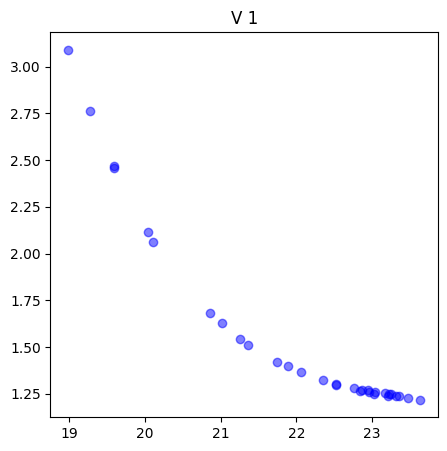

In [220]:
plt.figure(figsize=(5, 5))
plt.scatter(mag1, star_errors1, color='blue', alpha=0.5)
plt.title('V 1')
plt.show()

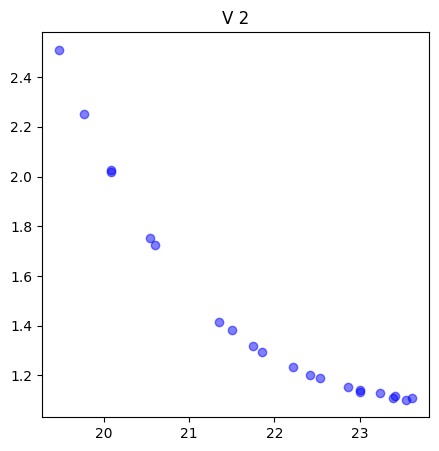

In [221]:
plt.figure(figsize=(5, 5))
plt.scatter(mag2, star_errors2, color='blue', alpha=0.5)
plt.title('V 2')
plt.show()

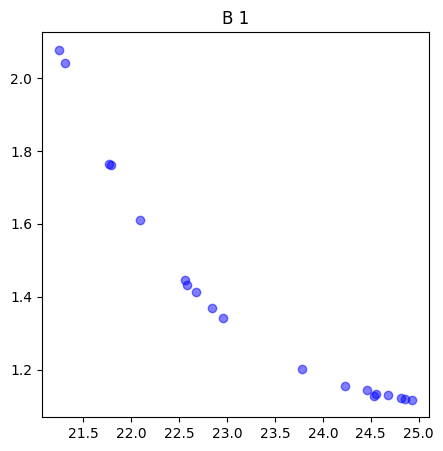

In [222]:
plt.figure(figsize=(5, 5))
plt.scatter(mag3, star_errors3, color='blue', alpha=0.5)
plt.title('B 1')
plt.show()

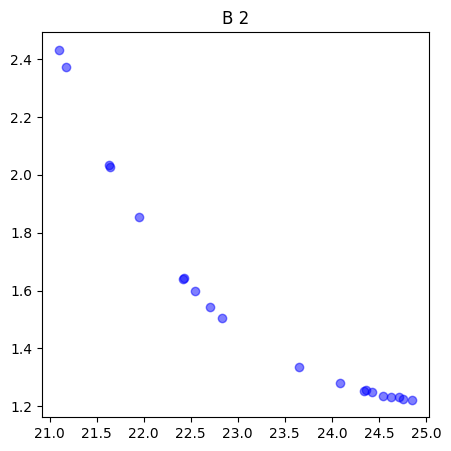

In [223]:
plt.figure(figsize=(5, 5))
plt.scatter(mag4, star_errors4, color='blue', alpha=0.5)
plt.title('B 2')
plt.show()